In [6]:
import numpy as np
import pandas as pd
from h3 import h3

import importlib
import matplotlib.pyplot as plt
%matplotlib inline

import itertools as it
import seaborn as sns
from concurrent.futures import ProcessPoolExecutor
from datetime import datetime, date, timedelta
from glob import glob
import sqlite3
import time
from tempfile import TemporaryDirectory

import functools as ft
import tilemapbase as tmb
import folium
from collections import namedtuple
import geojson as gj

import os
import sys
sys.path.append("../")
sys.path.append("../dsutils")

from dsutils import heatmap as hm, gif, timeutil as tu
from colorutil import color_selector_p

/home/uchiumi/.local/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/uchiumi/.local/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/uchiumi/.local/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful o

## Materials

In [7]:
def _swap(ls):
    return [
        (p[1], p[0])
        for p in ls
    ]

In [33]:
def draw(df, id_col, val_col, extent, color_selector, figsize=(8, 8), dpi=100, width=600, alpha=0.8, axis_visible=False):
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.xaxis.set_visible(axis_visible)
    ax.yaxis.set_visible(axis_visible)

    t = tmb.tiles.build_OSM()
    plotter = tmb.Plotter(extent, t, width=width)
    plotter.plot(ax, t)

    n = len(df)
    for i in range(n):
        id = df[id_col].iloc[i]
        val = df[val_col].iloc[i]
        color = "red" # color_selector(val)
        color = color_selector(val)
        vts = _swap(h3.h3_to_geo_boundary(id))
        xys = [tmb.project(*x) for x in vts]
        poly = plt.Polygon(xys, fc=color, alpha=alpha)
        ax.add_patch(poly)

    return fig, ax

In [9]:
import tilemapbase as tmb
tmb.start_logging()
t = tmb.tiles.build_OSM()

## Make .PNG

In [12]:
YYYYMMDD="20200419"

STR_DATE_LIST = [
    "20200301",
    "20200308",
    "20200315",
    "20200322",
    "20200329",
    "20200405",
    "20200412",
    "20200419",
]

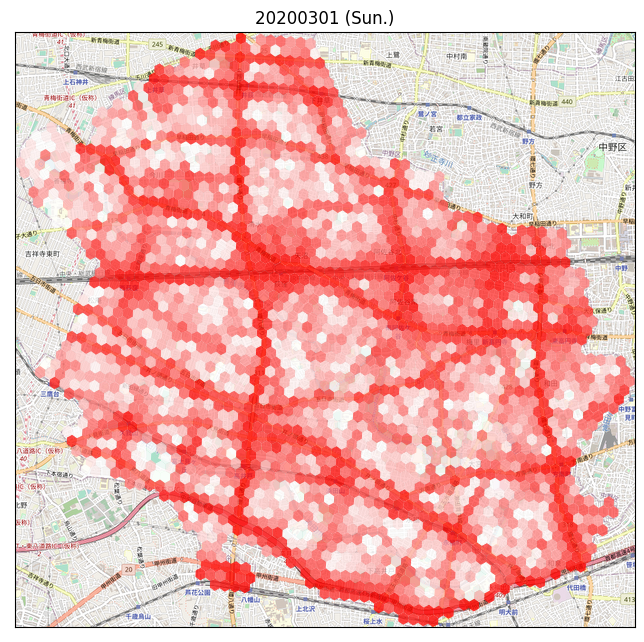

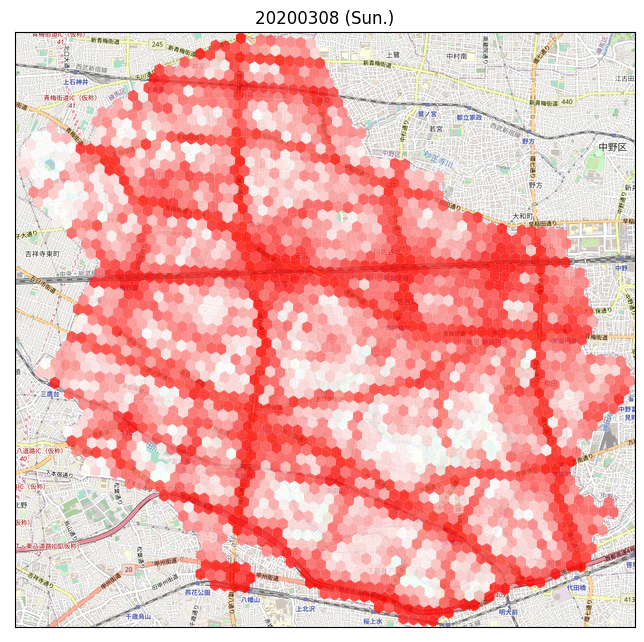

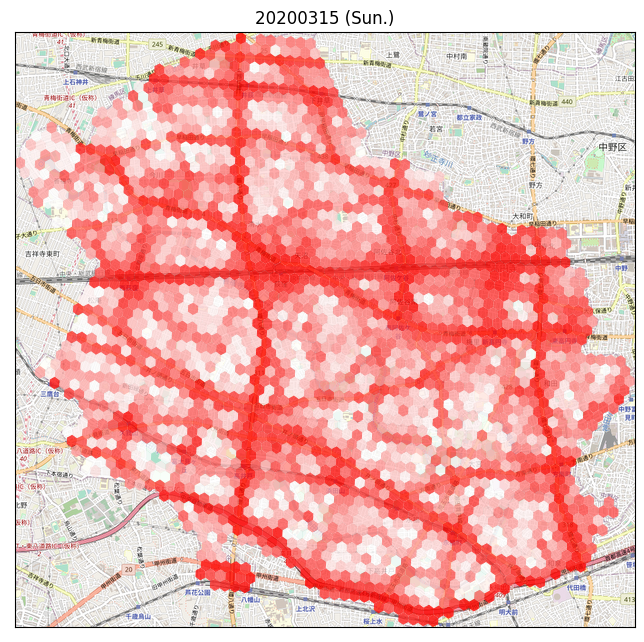

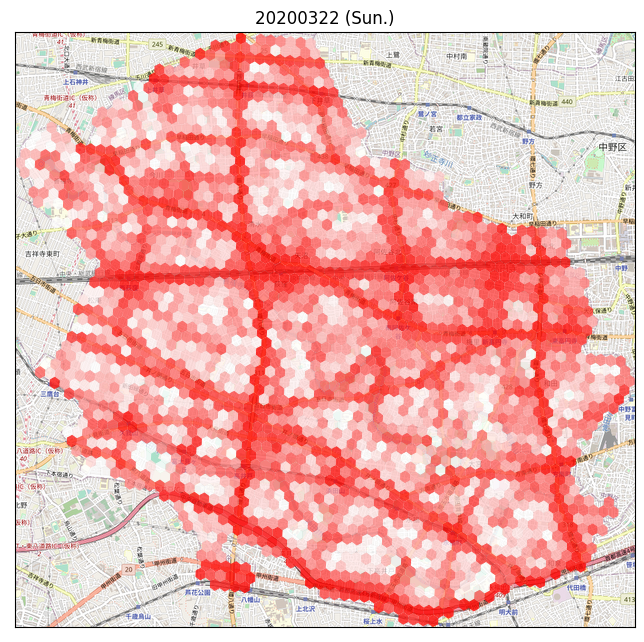

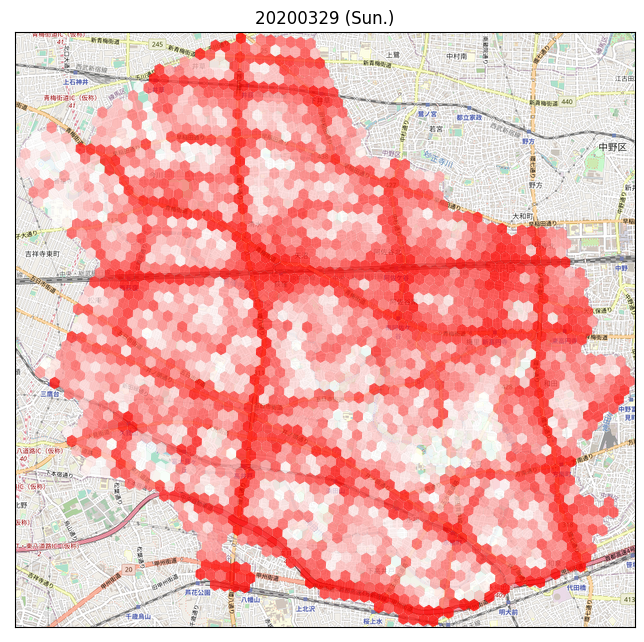

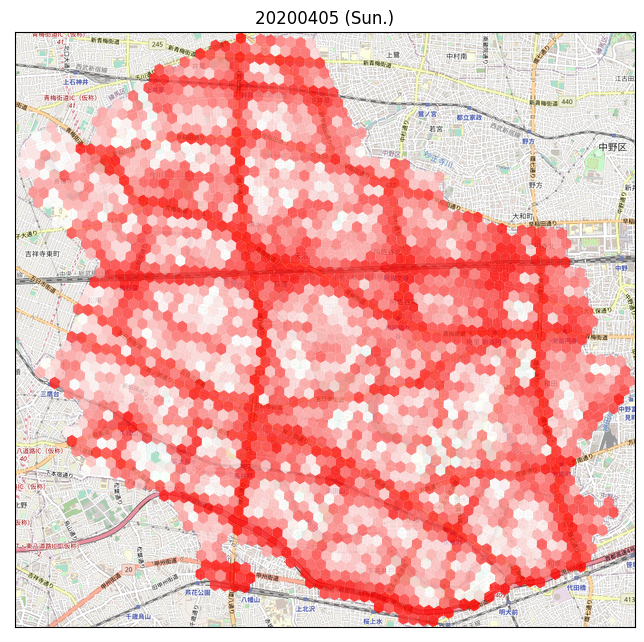

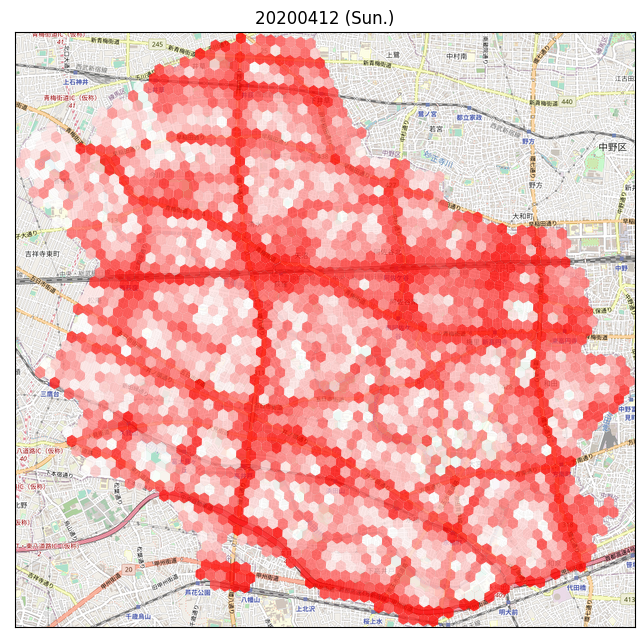

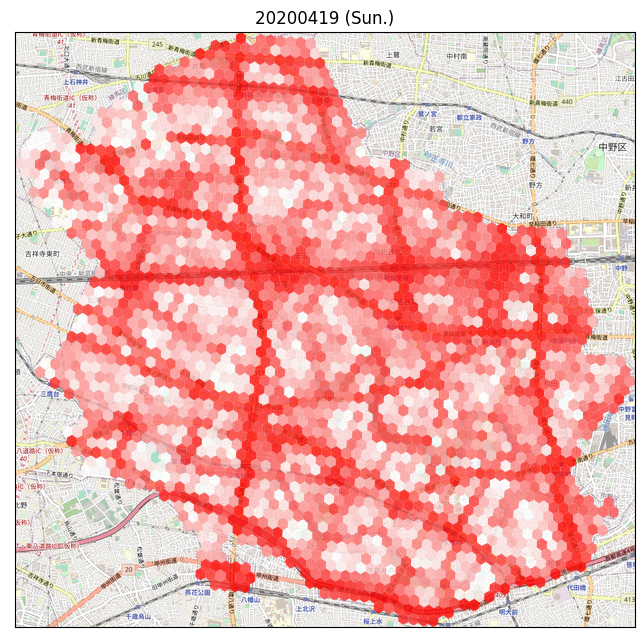

In [14]:
for YYYYMMDD in STR_DATE_LIST:
    df = pd.read_csv("./data/heatmap_"+YYYYMMDD+".csv")
    ex = hm.extent(df["h3_10_id"])
    cs = color_selector_p(df["cnt_uuid"], 20)

    fig_name = "heatmap_suginami_" + YYYYMMDD+".png"

    fig, ax = draw(df, "h3_10_id", "cnt_uuid", ex, cs)
    plt.title(YYYYMMDD+" (Sun.)")
    fig.show()
    fig.savefig(fig_name)

TypeError: 'MovieWriterRegistry' object is not an iterator

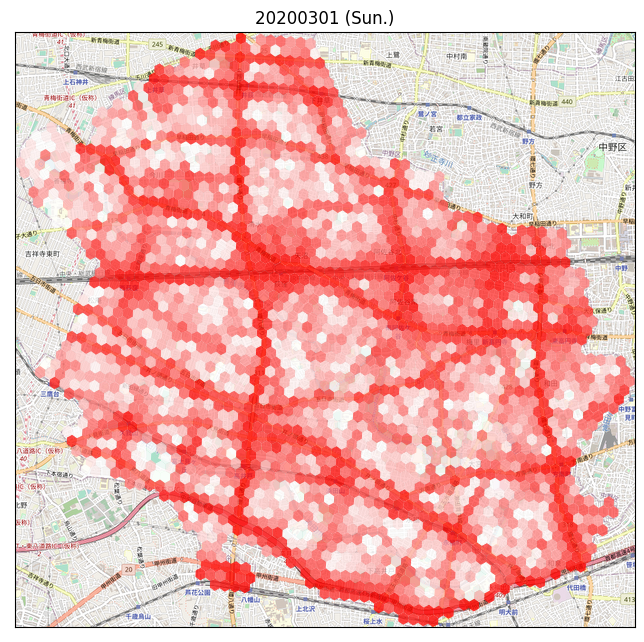

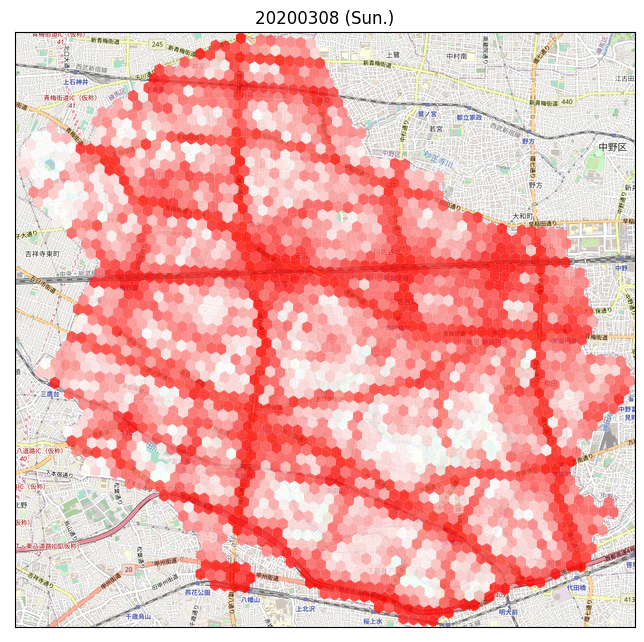

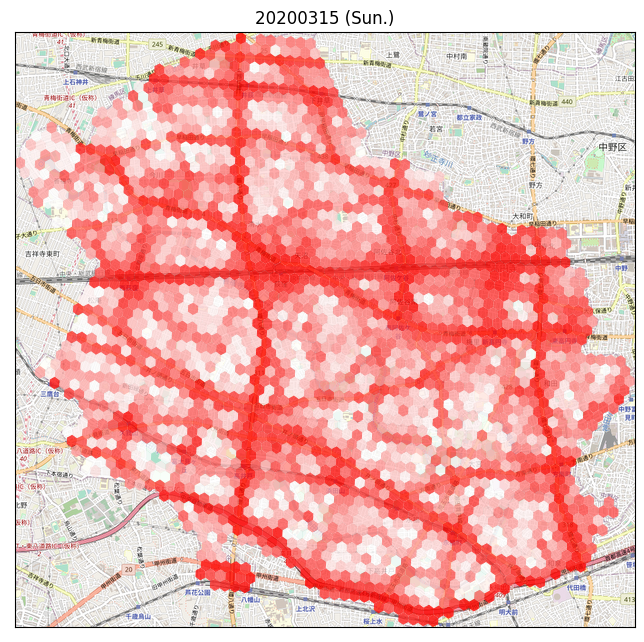

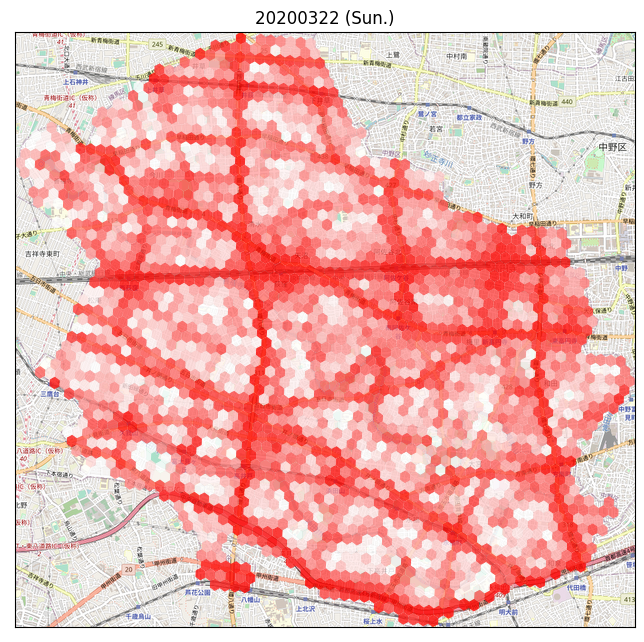

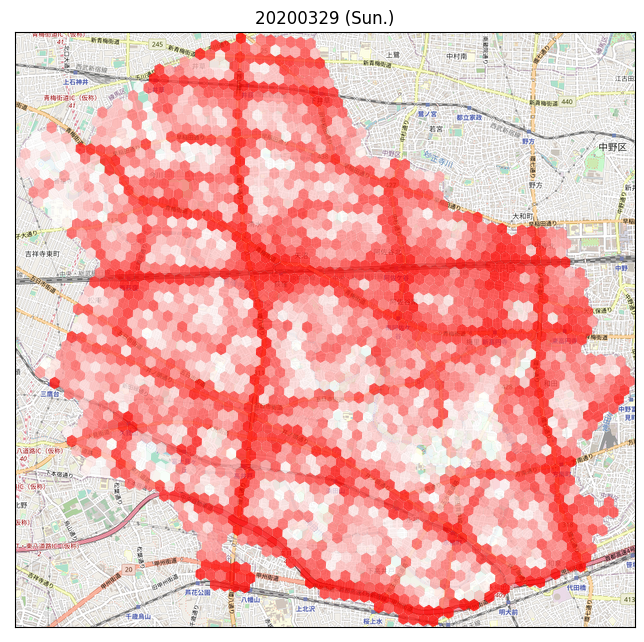

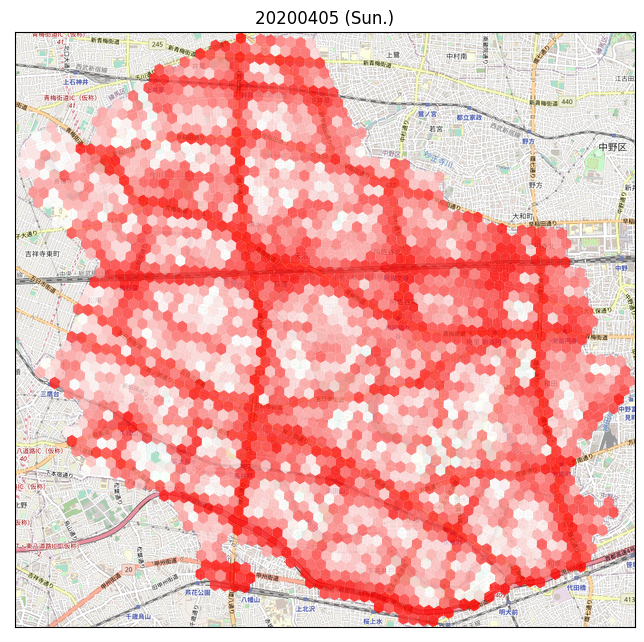

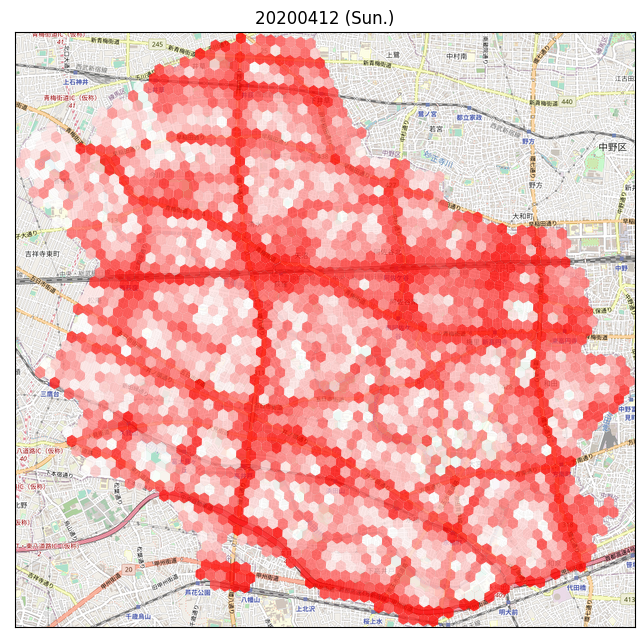

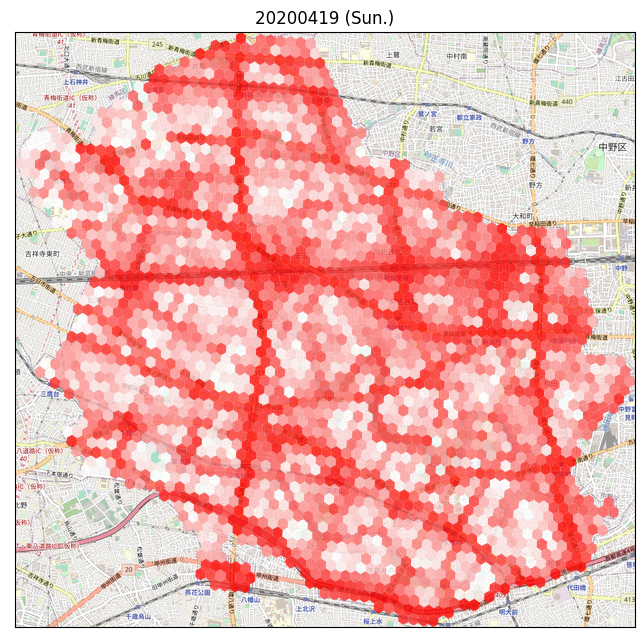

<Figure size 432x288 with 0 Axes>

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation


ims = []
for YYYYMMDD in STR_DATE_LIST:
    df = pd.read_csv("./data/heatmap_"+YYYYMMDD+".csv")
    ex = hm.extent(df["h3_10_id"])
    cs = color_selector_p(df["cnt_uuid"], 20)

    fig, ax = draw(df, "h3_10_id", "cnt_uuid", ex, cs)
    plt.title(YYYYMMDD+" (Sun.)")    
    ims.append([fig])

fig = plt.figure()
ani = animation.ArtistAnimation(fig, ims)
ani.save('anim.gif', writer="imagemagick")
ani.save('anim.mp4', writer="ffmpeg")
plt.show()

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation


figsize=(8, 8)
dpi=100
width=600
alpha=0.8
axis_visible=False
    
def update(i):
    YYYYMMDD = STR_DATE_LIST[i]
    if i != 0:
        plt.cla() #現在描写されているグラフを消去
        
    df = pd.read_csv("./data/heatmap_"+YYYYMMDD+".csv")
    ex = hm.extent(df["h3_10_id"])
    cs = color_selector_p(df["cnt_uuid"], 20)
    
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.xaxis.set_visible(axis_visible)
    ax.yaxis.set_visible(axis_visible)

    t = tmb.tiles.build_OSM()
    plotter = tmb.Plotter(extent, t, width=width)
    plotter.plot(ax, t)

    n = len(df)
    for i in range(n):
        id = df[id_col].iloc[i]
        val = df[val_col].iloc[i]
        color = "red" # color_selector(val)
        color = color_selector(val)
        vts = _swap(h3.h3_to_geo_boundary(id))
        xys = [tmb.project(*x) for x in vts]
        poly = plt.Polygon(xys, fc=color, alpha=alpha)
        ax.add_patch(poly)
        
    plt.title(YYYYMMDD+" (Sun.)")
    plt.show()

def draw_():
    fig = plt.figure() #figure objectを取得
    ani = animation.FuncAnimation(fig, update, fargs = None, interval = 100, frames = 10, blit=True)
    ani.save("test.gif", writer = 'imagemagick')

Traceback (most recent call last):
  File "/home/uchiumi/.local/lib/python3.6/site-packages/matplotlib/cbook/__init__.py", line 196, in process
    func(*args, **kwargs)
  File "/home/uchiumi/.local/lib/python3.6/site-packages/matplotlib/animation.py", line 951, in _start
    self._init_draw()
  File "/home/uchiumi/.local/lib/python3.6/site-packages/matplotlib/animation.py", line 1743, in _init_draw
    self._draw_frame(next(self.new_frame_seq()))
  File "/home/uchiumi/.local/lib/python3.6/site-packages/matplotlib/animation.py", line 1766, in _draw_frame
    self._drawn_artists = self._func(framedata, *self._args)
  File "<ipython-input-37-fc9454d24fdb>", line 26, in update
    plotter = tmb.Plotter(extent, t, width=width)
NameError: name 'extent' is not defined


TypeError: 'MovieWriterRegistry' object is not an iterator

<Figure size 432x288 with 0 Axes>

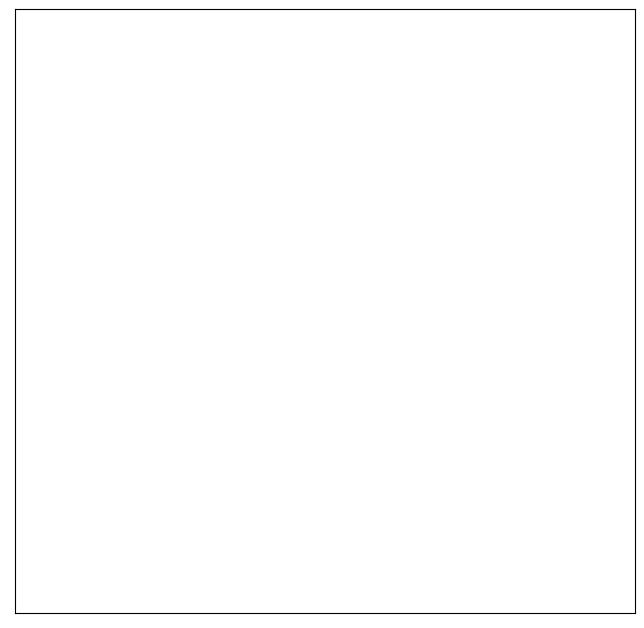

In [38]:
draw_()

In [28]:
files = [
    "heatmap_suginami_20200301.png",
    "heatmap_suginami_20200308.png",
    "heatmap_suginami_20200315.png",
    "heatmap_suginami_20200322.png",
    "heatmap_suginami_20200329.png",
    "heatmap_suginami_20200405.png",
    "heatmap_suginami_20200412.png",
    "heatmap_suginami_20200419.png",
]

In [24]:
import subprocess as sp
import sys


def make_gif(files, output, interval=10):
    cmd = [
        "convert",
        "-layers",
        "optimize",
        "-loop",
        "0",
        "-delay",
        str(interval)
    ] + list(files) + [
        output
    ]
    r = sp.run(cmd, stdout=sp.PIPE, stderr=sp.PIPE)
    o = r.stdout.decode("utf-8")
    e = r.stderr.decode("utf-8")
    print(o)
    if len(e) > 0:
        msg = f"{e}\n{' '.join(cmd)}\n"
        sys.stderr.write(msg)

In [29]:
make_gif(files, "out.gif")

FileNotFoundError: [Errno 2] No such file or directory: 'convert': 'convert'